# Multi-Class Dog Breed Classifier

This notebook builds an end to end Multi-class image classifier using TensorFlow 2.0 and TensorFlow HUB

## 1.Problem Statement

Identifying the breed of dog given the image of the dog

## 2.Data

The Data we are using is from the Kaggle's Dog Breed Classification
**Link**: https://www.kaggle.com/c/dog-breed-identification/data

## 3.Evaluation

Evaluation is a file with prediction probabilities for each dog breed of each test image

**Link**: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4.Features

Some information about the data:

* The data is unstructured (i.e) Data is Images Using Deep Learning/Transfer Learning
* There are 120 breeds of Dog (i.e) There are 120 Classes
*There are 10,000+ images in the training set(with labels)
*There are 10,000+ images in the testing set(without labels which we will predict them)



In [ ]:
# Unziping the data 
#!unzip "/content/drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

### Getting our Workspace Ready

In [ ]:
#import the necessary tools into colab
import tensorflow as tf
import tensorflow_hub as hub
print("tensorflow version",tf.__version__)
print("tensorflow hub version:",hub.__version__)
print("GPU is available" if tf.config.list_physical_devices("GPU") else "Not available")

tensorflow version 2.3.0
tensorflow hub version: 0.9.0
GPU is available


#### Getting our data ready (Turning it into Tensors)
#### Turning our images into Tensors(numeric representations) is the important thing in all the machine learning models
#### Accessing data and checking out the labels

In [ ]:
import pandas as pd
label_csv=pd.read_csv("/content/drive/My Drive/Dog Vision/labels.csv")
print(label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     a02657e33f6b2895506aa317783b9d09  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


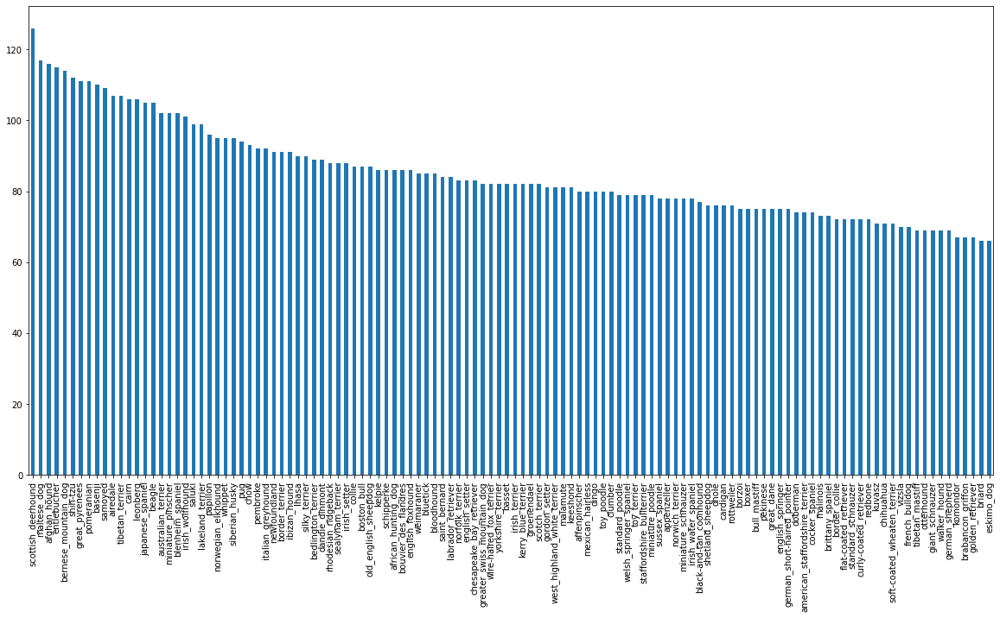

In [ ]:
# How many images are there in each class
label_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [ ]:
label_csv["breed"].value_counts().median()

82.0

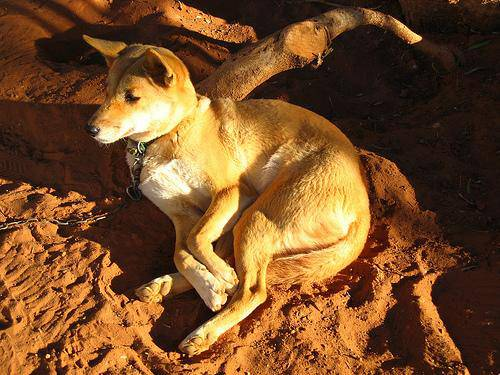

In [ ]:
# To View an Image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

#### Getting all the Images and their labels

##### Let's get a list of all our file path names


In [ ]:
# Create path names from image ID
filenames = ["drive/My Drive/Dog Vision/train/"+fname+".jpg" for fname in label_csv["id"] ]

In [ ]:
filenames

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/My Drive/Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/My Drive/Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/My Drive/Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/My Drive/Dog Vision/train/006cc3ddb9dc1bd82

In [ ]:
# Check whether the number of filenmaes actually matches with the image files
import os 
if len(os.listdir("drive/My Drive/Dog Vision/train/"))==len(filenames):
  print("Filenames match the actual images.Proceed!")
else:
  print("The Filenames doesn't match the images")

Filenames match the actual images.Proceed!


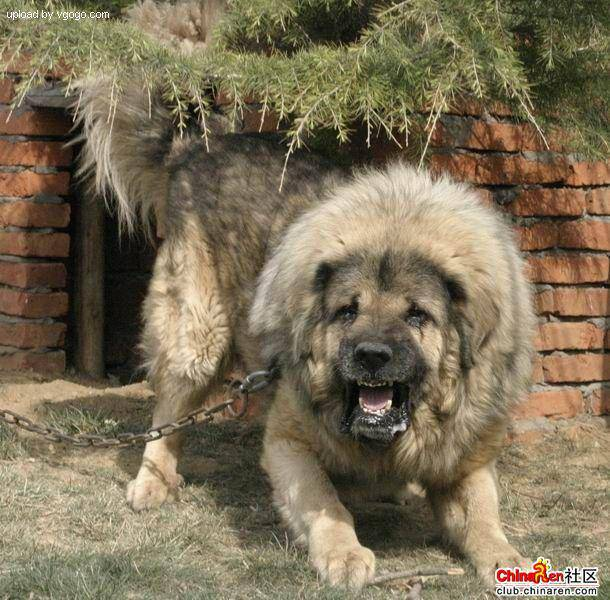

In [ ]:
Image(filenames[9000])

In [ ]:

label_csv["breed"][9000]

'tibetan_mastiff'

### Preparing labels

In [ ]:
import numpy as np
labels = label_csv["breed"].to_numpy()


In [ ]:
len(labels)

10222

In [ ]:
# Check the number of labels is equal to no of filenames
if len(labels)==len(filenames):
  print("The length of the labels matches the filenames")
else:
  print("They do not match")

The length of the labels matches the filenames


In [ ]:
# Find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turning a single label into boolean array
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turning every label into boolean array
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning a  boolean array into numbers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where the label occurs in the boolean array
print(boolean_labels[0].astype(int))


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


#### Creating our own validation set
There is no validation set in the kaggle so we are creating our own set

In [ ]:
# Set X and y variables
X=filenames
y=boolean_labels

#### Experimentating with 10000 samples and increase as needed

In [ ]:
# Set the number of images to use for experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
# Split data into training and validation set
from sklearn.model_selection import train_test_split
# Split them into training and validation sets of size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=69)

In [ ]:
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

### Preprocessing Images (Turning Images into Tensors) 

(Tensors are nothing but a numeric representations)

#### Creating a function that should perform the following:
1) Take image filepath as input

2) Use Tensorflow to read the file and save it to a variable **image**

3) Turn our **image**(a jpg) into tensors

4) Normalize our colour channels from 0-255 to 0-1

5) Resize the **image** to be a shape of (224,224)

6) Return our modified **image**

In [ ]:
# Convert a image into numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into tensors
tf.constant(image)[:2]


<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

#### Creating a function that should perform the following:
1) Take image filepath as input

2) Use Tensorflow to read the file and save it to a variable **image**

3) Turn our **image**(a jpg) into tensors

4) Normalize our colour channels from 0-255 to 0-1

5) Resize the **image** to be a shape of (224,224)

6) Return our modified **image**

In [ ]:
IMG_SIZE=224

# Defining a function that can preprocess the image
def preprocess_image(image_path,img_size=IMG_SIZE):
  """
  Turns a image file path into Tensors
  """
  # Read an image file
  image=tf.io.read_file(image_path)
  # Turning the jpg into numerical tensors with 3 colour channel (Red,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize our images into desired value 224
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


#### Turning our data into batches
Batch size must be 32(processes 32 images at a time)

Inorder to use Tensorflow effectively the data must be in the form of tensor tuples (images,label)


In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image path file and associated label and then preprocess the image and returns a tuple of (image,label)
  """
  image=preprocess_image(image_path)
  return image,label

##### Creating a function to change all our X and y into batches

In [ ]:
BATCH_SIZE=32
# Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches  of data out of image (X) and label (y) pairs
  Shufffle the data if its training set but doesn't shuffle if it's validation set
  Accepts the test data as input (no labels)
  """
  # If the data is test data then there will be no labels
  if test_data:
    print("Creating test data batches...")
    data =tf.data.Dataset.from_tensor_slices((tf.constant(X))) #Only filepaths with no labels
    data_batch=data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch
  #if it is validation data we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),(tf.constant(y))))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  # IF its a training data
  else:
    print("Creating training data batches")
    # Turn the filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    # Shuffling the data before mapping
    data=data.shuffle(buffer_size=len(X))
    # Creates (image,label) tuple and also changes them into preprocessed image
    data=data.map(get_image_label)
    # Turning the training data into batches
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

    

In [ ]:
# Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing the data batches

our data is now in batches let's visualize them

In [ ]:
import matplotlib.pyplot as plt
# Create functions to view images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # setup a figure 
  plt.figure(figsize=(10,10))
  # loop through 25 images
  for i in range(25):
    # Create subplots (5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
len(val_data)

7

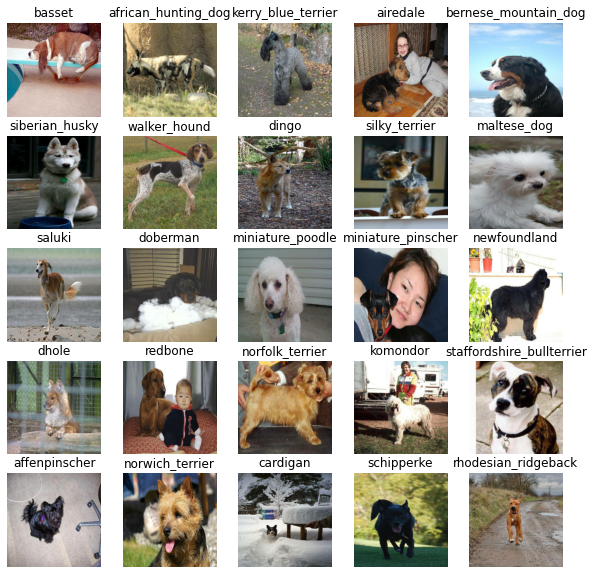

In [ ]:
# Unbatch the data using as_numpy_iterator
train_images,train_labels=next(train_data.as_numpy_iterator())
# Now lets visualize the images in the training batch
show_25_images(train_images,train_labels)

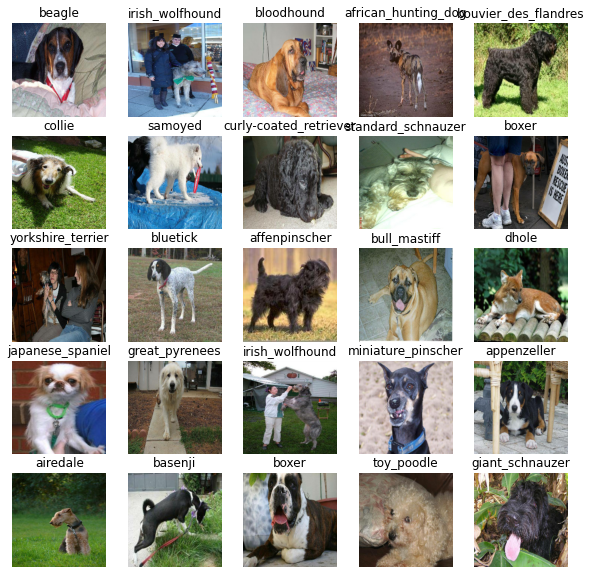

In [ ]:
# Now lets visualize the images in the validation batch
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a machine learning model

We must define certain things before building a model

* Define the input shape (our images in form of tensors) to the model
* Define the output shape(our images in form of tensors) for the model
* The url of the model we are going to use from tensorflow hub
link:https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
# Setup a input shape
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #batches,height,width,colour channels

# Setup the output shape
OUTPUT_SHAPE=len(unique_breeds)

#Setup Model URL from TensorFlow hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

#### Our inputs,outputs and model are ready
#### Let's put them together in a keras deep learning model

Define a function which:
  * Takes the input shape, output shape and the model we have chosen
  * Defines the layers in keras model in a sequential fashion
  * Compiles the model (says it should be evaluated and improved)
  * Builds the model (tells the model input shape that it will be getting)
  * Returns the model

All these steps are found in https://www.tensorflow.org/guide/keras/sequential_model


In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building the model with:",MODEL_URL)

  # Setup the model layers
  model=tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL), # Layer 1 (Input Layer)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                              activation="softmax") # Layer 2 (Output Layer)
        ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]

  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

Callbacks are a helper function that a model can use during its training as save its progress,check its progress or stop training early if a model stops improving 

We will create two callbacks,one for tensorflow board which helps track our model's progress and another for early stopping when the model is training too long

### TensorBoard Callbacks

To setup a TensorBoard callback we need to do 3 things:
         
         1.Load the tensorboard extension
         2.Create a tensorboard callback which is able to save logs to a directory and pass it to our model's fit function
         3.Visualize our training logs with Tensorboard function (which will be done after the training)


In [ ]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# Create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/My Drive/Dog Vision/logs",
                      # Make it so the logs gets tracked whenever we run the expirement
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir) 
  
  


### Early Stopping callback

Early stopping helps our model from overfitting by stoping the training if a certain evaluation metrics stops

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create a early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training a model on a subset of data

Our first model is only going to train on 1000 images to make sure everything is fine


In [ ]:
NUM_EPOCHS= 100 #@param {type:"slider",min:10,max:100,step:10}

##### Creating a function which can trains a model

* Let's create a model using 'create_model()'
* Setup a TensorBoard callback using 'create_tensorboard_callback()'
* Call our fit() function on our model passing it the training data,validation data,numner of epochs to train for ("NUM_EPOCHS") and the callbacks we would like to use
* return the model

In [ ]:
# Build a function to train a model and return a trained model
def train_model():
  """
  Trains a model and returns a trained model
  """
  # Create a model
  model=create_model()

  # Create a new session everytime we train a model
  tensorboard=create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model
  

In [ ]:
# Fit the model to the data
model=train_model()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.5917 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 661s 26s/step - loss: 4.5167 - accuracy: 0.1075 - val_loss: 3.3749 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 6s 220ms/step - loss: 1.6190 - accuracy: 0.6750 - val_loss: 2.1103 - val_accuracy: 0.5000
Epoch 3/100
25/25 [==============================] - 6s 221ms/step - loss: 0.5601 - accuracy: 0.9350 - val_loss: 1.6334 - val_accuracy: 0.5900
Epoch 4/100
25/25 [==============================] - 5s 220ms/step - loss: 0.2482 - accuracy: 0.9912 - val_loss: 1.4613 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 6s 222ms/step - loss: 0.1437 - accuracy: 0.9987 - val_loss: 1.3870 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 6s 225ms/step - loss: 0.0976 - accuracy: 1.0000 - val_loss: 1.3342 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 5s 219ms/step - loss: 0.0736 - accuracy: 1.0000 - val_loss: 1.3005 - val_accuracy: 0.6650
Epoch 8/100

### Checking the tensorboard log
%tensorboard function will access the logs directory we created earlier and visualize its content

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### Making and evaluating a model using trained model

In [ ]:
# Make predictions on the validation set
predictions=model.predict(val_data,verbose=1)
predictions

2/7 [=======>......................] - ETA: 0sWARNING:tensorflow:Callbacks method `on_predict_batch_end` is slow compared to the batch time (batch time: 0.0668s vs `on_predict_batch_end` time: 0.1095s). Check your callbacks.


7/7 [==============================] - 1s 155ms/step


array([[4.46286176e-05, 2.15630629e-03, 6.65668776e-05, ...,
        1.14182265e-04, 1.34145061e-03, 5.89901756e-04],
       [1.06423595e-05, 1.43320960e-06, 5.01149498e-06, ...,
        3.56226974e-06, 1.59839308e-03, 5.86001079e-07],
       [9.14712814e-07, 6.91229070e-05, 8.56125644e-06, ...,
        1.88637034e-06, 2.24839569e-05, 3.92019319e-06],
       ...,
       [5.63619612e-03, 2.64586333e-06, 3.88546614e-05, ...,
        5.55429096e-06, 1.06917241e-06, 6.67429595e-06],
       [3.55239217e-06, 9.88491252e-07, 4.69474662e-06, ...,
        6.72956230e-05, 5.66500876e-06, 4.25481460e-07],
       [6.91713416e-04, 2.30972892e-05, 1.54004247e-05, ...,
        7.47310187e-05, 8.49908916e-04, 4.04706632e-04]], dtype=float32)

In [ ]:
# First predictions
index=42
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted Label:{unique_breeds[np.argmax(predictions[index])]}")

[1.0861747e-03 2.0329044e-04 2.5604857e-05 1.3994498e-04 1.0449571e-03
 3.8178370e-04 3.3093273e-04 1.3826702e-05 3.1663226e-03 1.1310971e-03
 4.0415816e-05 3.5507625e-03 7.0506101e-04 6.8536931e-01 6.5395703e-05
 3.7464025e-04 1.4870912e-05 3.1882082e-05 5.4240209e-04 3.5107840e-04
 1.4198270e-04 1.1449831e-04 3.4411938e-04 1.1645560e-05 1.4170107e-03
 9.2773043e-06 3.3034496e-05 2.9357539e-05 8.4549956e-06 5.6273642e-04
 2.9485824e-05 9.0009574e-04 2.6128078e-03 3.2958062e-04 5.5362696e-05
 9.0723443e-05 5.0333943e-05 4.6914893e-06 2.4469098e-05 6.4613397e-04
 1.3025796e-04 7.9000929e-05 5.4295921e-05 1.9770196e-06 2.1542051e-05
 1.5993279e-05 1.8275145e-05 1.8107671e-04 3.3028005e-05 2.2405903e-04
 4.2978959e-04 3.1877829e-05 1.1554394e-05 1.4244720e-04 8.6674945e-06
 5.7791643e-05 2.1750589e-03 1.4162000e-04 7.3191017e-04 4.6411187e-06
 2.8462908e-05 1.6791221e-02 3.2560902e-06 2.2956030e-05 2.0522866e-04
 4.7004083e-05 8.4304433e-05 7.5967091e-06 1.3461303e-04 1.3297981e-04
 3.128

##### **Note**:Prediction probabilities are also know as confident levels

In [ ]:
# Trun predicted probabilities into respective label
def get_pred_label(prediction_probabilities):
  """
  Turns a array of prediction possibilities into label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[0])
pred_label

'basset'

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

Our validation set is in batch dataset we will have to unbatch it on the validation images and then compare those predictions to the validation label (truth labels)

In [ ]:
# Create a function to unbatch the data 
def unbatch(data):
  images=[]
  labels=[]

  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images,val_labels=unbatch(val_data)
val_images[0],val_labels[0]

(array([[[0.11465735, 0.1734809 , 0.28720638],
         [0.07201748, 0.13084102, 0.24456652],
         [0.08408824, 0.14291178, 0.25663728],
         ...,
         [0.5553551 , 0.54751194, 0.4886884 ],
         [0.5371499 , 0.542262  , 0.47892162],
         [0.54257715, 0.55434185, 0.48767513]],
 
        [[0.0795773 , 0.13840084, 0.25212634],
         [0.09113678, 0.14996031, 0.2636858 ],
         [0.12752102, 0.18634455, 0.30007002],
         ...,
         [0.55548847, 0.54764533, 0.48882183],
         [0.5543099 , 0.559422  , 0.49608168],
         [0.56017166, 0.57193637, 0.5052697 ]],
 
        [[0.08795277, 0.14677629, 0.2605018 ],
         [0.08097528, 0.13979882, 0.2535243 ],
         [0.11011904, 0.16894259, 0.28266805],
         ...,
         [0.57007873, 0.5622356 , 0.50341207],
         [0.5403274 , 0.54518175, 0.48197028],
         [0.54660374, 0.55667025, 0.49085265]],
 
        ...,
 
        [[0.81751794, 0.8332042 , 0.82928264],
         [0.8122311 , 0.8279174 , 0.82399

In [ ]:
len(val_images)

200

Let's create a function which will 

  * Takes an array of prediction probabilities ,an array of truth labels and an array of images and integers
  * Convert the prediction probabilities into predicted label
  * Plot the predicted label ,its predicted probability,the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction,ground truth and the image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  #Plot Images and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the prediction if it's right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  #Change plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

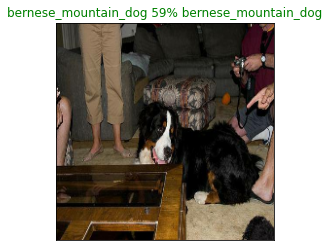

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)


#### Function to visualize our top 10 predictions

This function will:
* Takes input as prediction probabilities array and a ground truth array and an integer
* Find the prediction using get_pred_label()
* Find the top 10:
        * Prediction probabilities indexes
        * Prediction probabilities values
        * Prediction Labels
* Plot the top 10 prediction probability values and labels,coloring the true label green



In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  # Get the predicted label
  pred_label=get_pred_label(pred_prob)
  # Find the top 10 prediction confidence index
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")
  # Change the colour of true labels
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

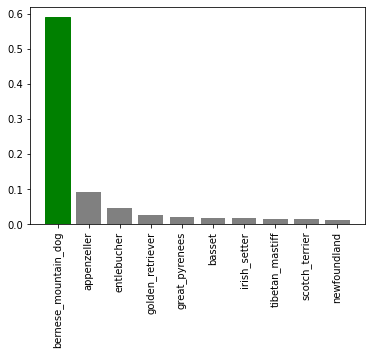

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=77)

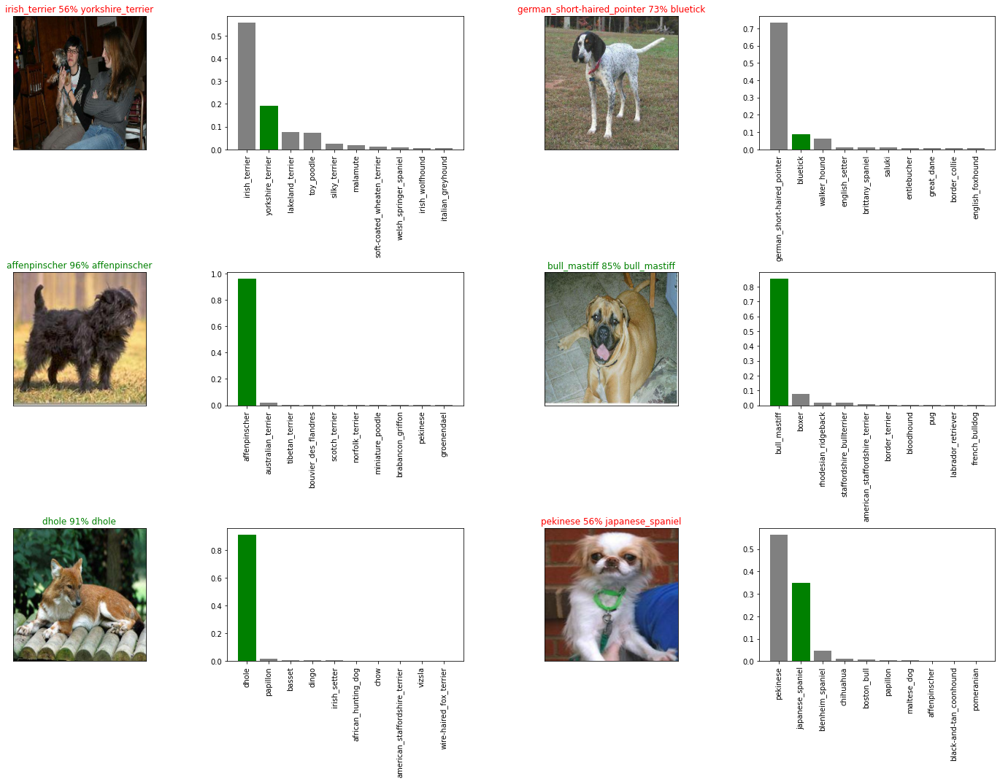

In [ ]:
# Let's checkout few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


Confusion matrix?


### Saving and loading a model

In [ ]:
# Function to save a model
def save_model(model,suffix=None):
  """
  Saves the given model in the directory and appends the suffix
  """
  # Create a model directory pathname with the current time
  modeldir=os.path.join("drive/My Drive/Dog Vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5"
  print(f"Saving model to:{model_path}......")
  model.save(model_path)
  return model_path

In [ ]:
# Function to Load a Trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading a saved model from {model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model
  

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to:drive/My Drive/Dog Vision/models/20200829-18221598725341-1000-images-mobilenetv2-Adam.h5......


'drive/My Drive/Dog Vision/models/20200829-18221598725341-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_images_model=load_model("drive/My Drive/Dog Vision/models/20200829-18221598725341-1000-images-mobilenetv2-Adam.h5")

Loading a saved model from drive/My Drive/Dog Vision/models/20200829-18221598725341-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 119ms/step - loss: 1.1541 - accuracy: 0.6900


[1.154080867767334, 0.6899999976158142]

In [ ]:
# Evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 118ms/step - loss: 1.1802 - accuracy: 0.6500


[1.1802297830581665, 0.6499999761581421]

### Training a data batch on full dataset

In [ ]:
# Create a databatch with full dataset
full_data=create_data_batches(X,y)

Creating training data batches


In [ ]:
# Create a model using full data
full_model=create_model()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create a full model callback
full_model_tesnorboard=create_tensorboard_callback()
# No validation set when training in all data so without early stopping we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

**Note:** Running the below code would train for around more than 30 mins as there are 10000 images to be loaded into the memory

In [ ]:
# Full the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tesnorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 7116s 22s/step - loss: 1.3186 - accuracy: 0.6720
Epoch 2/100
320/320 [==============================] - 54s 168ms/step - loss: 0.3915 - accuracy: 0.8843
Epoch 3/100
320/320 [==============================] - 53s 164ms/step - loss: 0.2368 - accuracy: 0.9374
Epoch 4/100
320/320 [==============================] - 53s 164ms/step - loss: 0.1533 - accuracy: 0.9640
Epoch 5/100
320/320 [==============================] - 53s 165ms/step - loss: 0.1052 - accuracy: 0.9792
Epoch 6/100
320/320 [==============================] - 53s 167ms/step - loss: 0.0766 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 53s 166ms/step - loss: 0.0592 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 54s 169ms/step - loss: 0.0461 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 54s 168ms/step - loss: 0.0381 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 54s 167m

In [ ]:
save_model(full_model,suffix="full-model-mobilenetv2-Adam")

Saving model to:drive/My Drive/Dog Vision/models/20200830-08191598775567-full-model-mobilenetv2-Adam.h5......


'drive/My Drive/Dog Vision/models/20200830-08191598775567-full-model-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/My Drive/Dog Vision/models/20200830-08191598775567-full-model-mobilenetv2-Adam.h5")

Loading a saved model from drive/My Drive/Dog Vision/models/20200830-08191598775567-full-model-mobilenetv2-Adam.h5


Making predictions on test dataset

Since our trained images are in the form of the Tensor Batches we need to convert the test images into Tensor batches

Use The function create_data_batches() functions

Before predicting we need to:
   * Get the test filenames 
   * Convert the filename into data batches using create_data_batches() function and change the test_data parameter into true
   * Making predictions array by passing the test batches to the predict() called on the model


In [ ]:
# Load test images filenames
test_path="drive/My Drive/Dog Vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog Vision/test/e92e6f99e804a6696cf0db266bbd7744.jpg',
 'drive/My Drive/Dog Vision/test/ea8669c09612478bfa202ae2fa101b13.jpg',
 'drive/My Drive/Dog Vision/test/ee59d7c0fdd2344e9d6d815f1099ffb1.jpg',
 'drive/My Drive/Dog Vision/test/f11d3e75389720c45f2c0001c131ba21.jpg',
 'drive/My Drive/Dog Vision/test/f0f205d037fe626670165aca00fc8b81.jpg',
 'drive/My Drive/Dog Vision/test/e917abf625ad6ba5b8a0e59bd23e8818.jpg',
 'drive/My Drive/Dog Vision/test/f2996e2ca11b93049069a4a7cafa0ce5.jpg',
 'drive/My Drive/Dog Vision/test/ef58b740df67a98d390f5bf8513bcea5.jpg',
 'drive/My Drive/Dog Vision/test/e89317cab9060dcaa19f1b669d363223.jpg',
 'drive/My Drive/Dog Vision/test/eef97d020c12ab1f73a2927b8271bb41.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create a test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling the predict in our full model will take a long time around 1hr or so

In [ ]:
# Make Predictions on the test data batch using the loaded_full_model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 8187s 25s/step


In [ ]:
# Save the predictions numpy array in the csv file for accessing it later
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")  

In [ ]:
# Load the predictions form csv file
test_predictions=np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.17130151e-11, 1.21529240e-07, 9.56235535e-10, ...,
        7.64782087e-08, 2.04376448e-07, 7.34274010e-08],
       [6.15450413e-10, 6.34999269e-13, 1.03524985e-14, ...,
        1.23725129e-14, 1.08298084e-14, 7.84487438e-13],
       [5.85266369e-09, 4.53583082e-09, 8.54770921e-10, ...,
        1.06442921e-09, 9.56902653e-03, 1.69479691e-07],
       ...,
       [3.66225300e-10, 1.86560811e-09, 1.87528446e-08, ...,
        3.36465405e-07, 1.76326452e-07, 2.65877403e-10],
       [1.58237017e-11, 2.29623276e-09, 8.13200174e-10, ...,
        2.11884156e-07, 8.12502149e-11, 2.13199007e-11],
       [5.03797139e-07, 1.10740261e-09, 8.84454121e-10, ...,
        2.80191703e-11, 3.05183107e-07, 3.40145903e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

# Preparing testdata set for kaggle
The output must be the format that kaggle asks for 
Link:

The CSV format should look like:

* A dataframe with ID column as well as column for each breed

* Add data to the ID column by extracting the test image IDs from their filepath's
  
* Add data (Prediction probabilities) to each of the dog breed column 

* Export the dataframe as csv to submit to the kaggle


In [ ]:
# Create Dataframe with empty columns
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions Dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e92e6f99e804a6696cf0db266bbd7744,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ea8669c09612478bfa202ae2fa101b13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,ee59d7c0fdd2344e9d6d815f1099ffb1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,f11d3e75389720c45f2c0001c131ba21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,f0f205d037fe626670165aca00fc8b81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e92e6f99e804a6696cf0db266bbd7744,1.1713e-11,1.21529e-07,9.56236e-10,2.68856e-06,7.46882e-09,1.79589e-08,1.2191e-07,3.82942e-08,2.70305e-09,1.71025e-07,4.48975e-10,8.12117e-13,7.75288e-06,4.74499e-07,8.3523e-07,1.42807e-05,8.37368e-07,4.88804e-05,8.72004e-08,4.52074e-07,7.1046e-09,7.8936e-09,4.24496e-07,5.6548e-08,2.38257e-08,1.40942e-06,3.37959e-10,3.93211e-08,1.31529e-05,2.41003e-08,2.4242e-09,2.84784e-12,8.92852e-08,2.07995e-05,1.35487e-07,2.84132e-10,2.65259e-06,3.63449e-05,5.15387e-08,...,0.336721,1.25576e-10,1.65635e-08,1.6287e-11,5.85857e-10,7.05486e-09,2.18781e-11,2.69025e-12,0.000287406,8.22713e-06,5.37349e-08,1.04115e-07,9.43322e-09,2.11618e-07,1.00991e-11,1.66264e-08,4.35773e-08,8.18897e-08,6.84739e-10,2.81497e-10,7.4928e-11,1.0482e-05,2.13527e-10,7.38352e-10,3.38713e-05,1.17594e-05,2.86897e-07,6.83686e-09,1.65627e-07,7.18388e-11,7.2162e-13,4.36624e-08,1.52893e-10,3.3949e-05,2.85151e-09,2.10224e-10,4.37835e-09,7.64782e-08,2.04376e-07,7.34274e-08
1,ea8669c09612478bfa202ae2fa101b13,6.1545e-10,6.34999e-13,1.03525e-14,2.50654e-14,1.94344e-09,9.88344e-14,1.25205e-10,5.9569e-11,1.19261e-12,1.06573e-13,2.17601e-14,6.12014e-10,3.76802e-13,1.88208e-12,2.63064e-12,2.46219e-12,6.8064e-10,7.12893e-16,4.47884e-11,3.23378e-12,3.10976e-12,1.37306e-12,1.45022e-12,6.09656e-11,2.01353e-13,7.87971e-14,3.76757e-11,3.76864e-13,4.51529e-15,1.18216e-12,3.17305e-08,2.49158e-08,5.55669e-10,5.9406e-10,2.08171e-14,7.70551e-13,7.4287e-13,3.80211e-12,1.19545e-11,...,6.64523e-15,1.3436e-11,5.73302e-09,7.68792e-13,7.6519e-11,7.89686e-13,1.99903e-12,2.89918e-08,1.83159e-14,3.08426e-12,1.49273e-11,8.91437e-12,4.22912e-12,1.50832e-12,0.999997,3.77198e-09,3.23895e-13,4.67492e-13,5.7902e-14,3.61694e-12,3.50111e-16,8.75648e-10,1.04396e-13,3.29197e-12,2.54222e-11,6.13943e-10,2.49834e-16,7.53544e-13,1.37102e-08,2.80099e-11,3.95978e-11,7.25087e-12,6.38219e-13,1.41476e-11,5.78302e-12,5.7463e-12,3.41891e-09,1.23725e-14,1.08298e-14,7.84487e-13
2,ee59d7c0fdd2344e9d6d815f1099ffb1,5.85266e-09,4.53583e-09,8.54771e-10,0.00046467,1.51969e-11,2.21594e-12,6.6567e-08,5.76455e-09,9.56597e-11,2.74341e-08,4.00009e-06,8.84582e-08,6.874e-09,1.00593e-08,8.58814e-09,5.20206e-11,7.81522e-11,5.80562e-07,6.32024e-10,2.22034e-10,6.01117e-08,2.26869e-10,8.6626e-07,8.63647e-07,2.07191e-10,1.68228e-09,5.97666e-09,6.56193e-12,1.25474e-09,3.94825e-09,1.15922e-11,2.43074e-10,1.29963e-09,1.29896e-10,4.36504e-09,2.98624e-05,3.75478e-12,1.3644e-09,1.04691e-08,...,1.63554e-08,3.67016e-07,7.0776e-06,0.00232886,1.96967e-12,7.61082e-10,9.89194e-10,1.14327e-10,2.60714e-09,2.7265e-11,1.0702e-09,4.35279e-11,1.1069e-10,3.81568e-13,2.27624e-11,2.32889e-09,8.23518e-09,1.30699e-08,1.38699e-05,3.19801e-10,7.88416e-11,2.5521e-10,7.73142e-11,4.91671e-07,1.27091e-08,5.10368e-10,0.000592101,9.45958e-09,1.29382e-09,2.54447e-08,2.94366e-07,2.21454e-09,1.56943e-08,4.3169e-09,4.38866e-10,4.17685e-10,5.52174e-09,1.0644

In [ ]:
# Saving our predictions dataframe to csv for submission to kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_prediction_1_mobilenetv2.csv",index=False)

## Making predictions on the custom images
* Get the filepaths of our own images.
* Turn the filepaths into the data batches using create_data_batches() and since our custom images won't have label we will set the test_data to true
* Pass the custom image data batch to the model's predict() method
* Convert the prediction output probabilities to predictions labels
* Compare the predicted labels to the custom images


In [ ]:
# Get the custom images filepaths
custom_path="drive/My Drive/Dog Vision/custom-images/"
custom_images_paths=[custom_path+fname for fname in os.listdir(custom_path)]

In [ ]:
custom_images_paths

['drive/My Drive/Dog Vision/custom-images/3.jpg',
 'drive/My Drive/Dog Vision/custom-images/2.jpg',
 'drive/My Drive/Dog Vision/custom-images/1.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data=create_data_batches(custom_images_paths,test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get the custom image prediction labels
custom_preds_label=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_label

['golden_retriever', 'golden_retriever', 'golden_retriever']

In [ ]:
# Unbatching manually as the unbatch_data won't work because there is no labels
custom_images=[]
# Loop through the unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

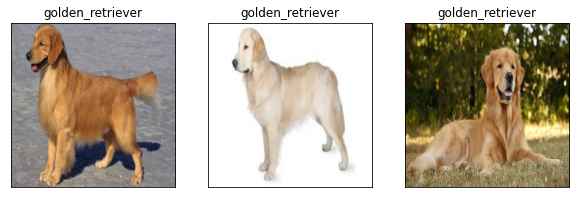

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_label[i])
  plt.imshow(image)